In [4]:
import os, torch, torch.nn as nn, torch.optim as optim
import numpy as np, random, warnings
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from torchvision import transforms, models
from sklearn.metrics import (accuracy_score, precision_score,
                             recall_score, f1_score,
                             confusion_matrix, classification_report)
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"✅ Device: {device}")

BASE = '/kaggle/input/datasets'

D1_FAKE     = f"{BASE}/manjilkarki/deepfake-and-real-images/Dataset/Train/Fake"
D1_REAL     = f"{BASE}/manjilkarki/deepfake-and-real-images/Dataset/Train/Real"
D1_VAL_FAKE = f"{BASE}/manjilkarki/deepfake-and-real-images/Dataset/Validation/Fake"
D1_VAL_REAL = f"{BASE}/manjilkarki/deepfake-and-real-images/Dataset/Validation/Real"
D1_TEST_FAKE= f"{BASE}/manjilkarki/deepfake-and-real-images/Dataset/Test/Fake"
D1_TEST_REAL= f"{BASE}/manjilkarki/deepfake-and-real-images/Dataset/Test/Real"

D2_FAKE     = f"{BASE}/xhlulu/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train/fake"
D2_REAL     = f"{BASE}/xhlulu/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train/real"
D2_VAL_FAKE = f"{BASE}/xhlulu/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake"
D2_VAL_REAL = f"{BASE}/xhlulu/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/real"

D3_FAKE     = f"{BASE}/tristanzhang32/ai-generated-images-vs-real-images/train/fake"
D3_REAL     = f"{BASE}/tristanzhang32/ai-generated-images-vs-real-images/train/real"
D3_TEST_FAKE= f"{BASE}/tristanzhang32/ai-generated-images-vs-real-images/test/fake"
D3_TEST_REAL= f"{BASE}/tristanzhang32/ai-generated-images-vs-real-images/test/real"

MODEL_SAVE  = "/kaggle/working/efficientnet_v3_best.pth"

print("\n📊 Dataset summary:")
total_train = 0
for name, path in [
    ("D1 Train Fake", D1_FAKE), ("D1 Train Real", D1_REAL),
    ("D2 Train Fake", D2_FAKE), ("D2 Train Real", D2_REAL),
    ("D3 Train Fake", D3_FAKE), ("D3 Train Real", D3_REAL),
]:
    n = len([f for f in os.listdir(path)
             if f.lower().endswith(('.jpg','.jpeg','.png'))])
    total_train += n
    print(f"  ✅ {name:<20}: {n:,}")
print(f"\n  Total train images: {total_train:,}")

✅ Device: cuda

📊 Dataset summary:
  ✅ D1 Train Fake       : 70,001
  ✅ D1 Train Real       : 70,001
  ✅ D2 Train Fake       : 50,000
  ✅ D2 Train Real       : 50,000
  ✅ D3 Train Fake       : 24,000
  ✅ D3 Train Real       : 24,000

  Total train images: 288,002


In [5]:
IMG_SIZE, BATCH_SIZE = 224, 32

train_tfm = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(0.3, 0.3, 0.2),
    transforms.RandomGrayscale(0.05),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])])

val_tfm = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])])

class FolderDataset(Dataset):
    def __init__(self, fake_dir, real_dir, transform, max_per_class=None):
        self.transform = transform
        fake = [os.path.join(fake_dir,f) for f in os.listdir(fake_dir)
                if f.lower().endswith(('.jpg','.jpeg','.png'))]
        real = [os.path.join(real_dir,f) for f in os.listdir(real_dir)
                if f.lower().endswith(('.jpg','.jpeg','.png'))]
        if max_per_class:
            fake = random.sample(fake, min(max_per_class, len(fake)))
            real = random.sample(real, min(max_per_class, len(real)))
        self.samples = [(p,0) for p in fake] + [(p,1) for p in real]
        random.shuffle(self.samples)
    def __len__(self): return len(self.samples)
    def __getitem__(self, idx):
        path, label = self.samples[idx]
        try:
            img = Image.open(path).convert('RGB')
            return self.transform(img), torch.tensor(label, dtype=torch.long)
        except:
            return self.__getitem__((idx+1) % len(self.samples))

print("⏳ Building datasets...")
d1 = FolderDataset(D1_FAKE, D1_REAL, train_tfm)   # 140K face swaps
d2 = FolderDataset(D2_FAKE, D2_REAL, train_tfm)   # 100K StyleGAN faces
d3 = FolderDataset(D3_FAKE, D3_REAL, train_tfm)   # 48K AI generated

combined_train = ConcatDataset([d1, d2, d3])

# Val: combine both val sets
val_d1 = FolderDataset(D1_VAL_FAKE, D1_VAL_REAL, val_tfm)
val_d2 = FolderDataset(D2_VAL_FAKE, D2_VAL_REAL, val_tfm)
val_ds = ConcatDataset([val_d1, val_d2])

test_ds = FolderDataset(D3_TEST_FAKE, D3_TEST_REAL, val_tfm)

train_loader = DataLoader(combined_train, batch_size=BATCH_SIZE,
                          shuffle=True, num_workers=4, pin_memory=True)
val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_ds, batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=4, pin_memory=True)

print(f"✅ Train  : {len(combined_train):,}")
print(f"   Val    : {len(val_ds):,}")
print(f"   Test   : {len(test_ds):,}")
print(f"   Batches: {len(train_loader):,}")

⏳ Building datasets...
✅ Train  : 288,002
   Val    : 59,428
   Test   : 12,000
   Batches: 9,001


In [6]:
def build_efficientnet(num_classes=2, dropout=0.3):
    m = models.efficientnet_b0(weights='IMAGENET1K_V1')
    for p in m.parameters(): p.requires_grad = False
    for p in m.features[5:].parameters(): p.requires_grad = True
    inf = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(dropout), nn.Linear(inf,512),
        nn.ReLU(), nn.Dropout(dropout/2), nn.Linear(512,2))
    return m

model = build_efficientnet()

# Load V2 if you uploaded it — otherwise trains from ImageNet
V2_PATH = "/kaggle/input/ravalkolpravalika/efficientnet_v2_best.pth"
if os.path.exists(V2_PATH):
    w = torch.load(V2_PATH, map_location=device)
    model.load_state_dict(w['model_state'] if 'model_state' in w else w)
    print("✅ V2 checkpoint loaded — fine-tuning!")
else:
    print("⚠️  No V2 found — training from ImageNet weights")

if torch.cuda.device_count() > 1:
    print(f"✅ Using {torch.cuda.device_count()} GPUs!")
    model = nn.DataParallel(model)
model = model.to(device)

⚠️  No V2 found — training from ImageNet weights
✅ Using 2 GPUs!


In [4]:
import os
for root, dirs, files in os.walk('/kaggle/input/datasets/ravalkolpravalika/'):
    for f in files:
        print(os.path.join(root, f))

/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v2_best.pth


In [5]:
print(f"GPUs being used: {torch.cuda.device_count()}")
print(f"Model type: {type(model)}")

GPUs being used: 2
Model type: <class 'torch.nn.parallel.data_parallel.DataParallel'>


In [7]:
# ── Faster settings ──────────────────────────────────────────
EPOCHS     = 5    # 5 is enough — model already has good base
BATCH_SIZE = 64   # Double batch size — faster per epoch
LR         = 3e-5

# Rebuild loaders with batch=64
train_loader = DataLoader(combined_train, batch_size=64,
                          shuffle=True, num_workers=4,
                          pin_memory=True)
val_loader   = DataLoader(val_ds, batch_size=64,
                          shuffle=False, num_workers=4,
                          pin_memory=True)
test_loader  = DataLoader(test_ds, batch_size=64,
                          shuffle=False, num_workers=4,
                          pin_memory=True)

print(f"✅ Batch size: 64")
print(f"   Steps per epoch: {len(train_loader):,}")
print(f"   Est. time/epoch: ~2.5 hrs")
print(f"   Total 5 epochs : ~12 hrs")

✅ Batch size: 64
   Steps per epoch: 4,501
   Est. time/epoch: ~2.5 hrs
   Total 5 epochs : ~12 hrs


In [ ]:
EPOCHS = 3
LR     = 3e-5

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.3, patience=2)

def train_epoch(model, loader):
    model.train()
    ls, correct, total = 0, 0, 0
    for i, (imgs, labels) in enumerate(loader):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        ls      += loss.item()
        correct += (out.argmax(1)==labels).sum().item()
        total   += labels.size(0)
        if (i+1) % 500 == 0:
            print(f"  Step {i+1:>5}/{len(loader)} | "
                  f"Loss {loss.item():.4f} | Acc {correct/total*100:.2f}%")
    return ls/len(loader), correct/total

def eval_epoch(model, loader):
    model.eval()
    ls, correct, total = 0, 0, 0
    preds_all, labels_all = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            out  = model(imgs)
            ls  += criterion(out, labels).item()
            p    = out.argmax(1)
            correct += (p==labels).sum().item()
            total   += labels.size(0)
            preds_all.extend(p.cpu().numpy())
            labels_all.extend(labels.cpu().numpy())
    return ls/len(loader), correct/total, preds_all, labels_all

history = {'tl':[],'vl':[],'ta':[],'va':[]}
best_val_acc = 0
best_state   = None

print("🚀 Training V3 — Full Dataset (288K+ images)")
print("=" * 55)

for epoch in range(EPOCHS):
    print(f"\n📌 Epoch {epoch+1}/{EPOCHS}")
    print("-" * 45)

    tl, ta = train_epoch(model, train_loader)
    vl, va, vp, vl2 = eval_epoch(model, val_loader)
    scheduler.step(vl)

    history['tl'].append(tl); history['vl'].append(vl)
    history['ta'].append(ta); history['va'].append(va)

    sd = (model.module.state_dict()
          if isinstance(model, nn.DataParallel)
          else model.state_dict())

    if va > best_val_acc:
        best_val_acc = va
        best_state   = {k: v.clone() for k,v in sd.items()}
        torch.save(best_state, MODEL_SAVE)
        print(f"  💾 Best saved! Val Acc: {va*100:.2f}%")

    torch.save({
    'epoch': epoch+1,
    'model_state': sd,
    'optimizer_state': optimizer.state_dict(),
    'val_acc': va,
    'history': history
}, f"/kaggle/working/v3_checkpoint_epoch_{epoch+1}.pth")

     # Download link for checkpoint
    from IPython.display import FileLink, display
    print(f"⬇️ Download checkpoint for Epoch {epoch+1}:")
    display(FileLink(f"/kaggle/working/v3_checkpoint_epoch_{epoch+1}.pth"))

    print(f"  Train → Loss {tl:.4f} | Acc {ta*100:.2f}%")
    print(f"  Val   → Loss {vl:.4f} | Acc {va*100:.2f}%")
    print(f"  Val F1: {f1_score(vl2,vp)*100:.2f}%")

print(f"\n🎉 Done! Best Val Acc: {best_val_acc*100:.2f}%")

🚀 Training V3 — Full Dataset (288K+ images)

📌 Epoch 1/3
---------------------------------------------
  Step   500/4501 | Loss 0.3792 | Acc 74.56%
  Step  1000/4501 | Loss 0.3324 | Acc 80.16%
  Step  1500/4501 | Loss 0.3041 | Acc 82.79%
  Step  2000/4501 | Loss 0.1860 | Acc 84.45%
  Step  2500/4501 | Loss 0.0788 | Acc 85.57%
  Step  3000/4501 | Loss 0.1364 | Acc 86.47%
  Step  3500/4501 | Loss 0.1472 | Acc 87.21%
  Step  4000/4501 | Loss 0.1531 | Acc 87.82%
  Step  4500/4501 | Loss 0.1795 | Acc 88.37%
  💾 Best saved! Val Acc: 94.79%
⬇️ Download checkpoint for Epoch 1:


/kaggle/working/v3_checkpoint_epoch_1.pth

  Train → Loss 0.2640 | Acc 88.37%
  Val   → Loss 0.1345 | Acc 94.79%
  Val F1: 94.79%

📌 Epoch 2/3
---------------------------------------------
  Step   500/4501 | Loss 0.1566 | Acc 93.05%
  Step  1000/4501 | Loss 0.0708 | Acc 93.19%
  Step  1500/4501 | Loss 0.0580 | Acc 93.28%
  Step  2000/4501 | Loss 0.0633 | Acc 93.47%
  Step  2500/4501 | Loss 0.1685 | Acc 93.59%
  Step  3000/4501 | Loss 0.1619 | Acc 93.72%
  Step  3500/4501 | Loss 0.1185 | Acc 93.84%
  Step  4000/4501 | Loss 0.1367 | Acc 93.93%
  Step  4500/4501 | Loss 0.0880 | Acc 94.01%
  💾 Best saved! Val Acc: 96.58%
⬇️ Download checkpoint for Epoch 2:


/kaggle/working/v3_checkpoint_epoch_2.pth

  Train → Loss 0.1505 | Acc 94.01%
  Val   → Loss 0.0907 | Acc 96.58%
  Val F1: 96.60%

📌 Epoch 3/3
---------------------------------------------
  Step   500/4501 | Loss 0.1630 | Acc 95.08%
  Step  1000/4501 | Loss 0.0450 | Acc 95.09%
  Step  1500/4501 | Loss 0.1932 | Acc 95.13%


In [15]:
EPOCHS = 3
LR     = 3e-5

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.3, patience=2)

def train_epoch(model, loader):
    model.train()
    ls, correct, total = 0, 0, 0
    for i, (imgs, labels) in enumerate(loader):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        ls      += loss.item()
        correct += (out.argmax(1)==labels).sum().item()
        total   += labels.size(0)
        if (i+1) % 500 == 0:
            print(f"  Step {i+1:>5}/{len(loader)} | "
                  f"Loss {loss.item():.4f} | Acc {correct/total*100:.2f}%")
    return ls/len(loader), correct/total

def eval_epoch(model, loader):
    model.eval()
    ls, correct, total = 0, 0, 0
    preds_all, labels_all = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            out  = model(imgs)
            ls  += criterion(out, labels).item()
            p    = out.argmax(1)
            correct += (p==labels).sum().item()
            total   += labels.size(0)
            preds_all.extend(p.cpu().numpy())
            labels_all.extend(labels.cpu().numpy())
    return ls/len(loader), correct/total, preds_all, labels_all

history = {'tl':[],'vl':[],'ta':[],'va':[]}
best_val_acc = 0
best_state   = None

In [16]:
checkpoint = torch.load(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/v3_checkpoint_epoch_2.pth",
    map_location=device)

sd = checkpoint['model_state']
if isinstance(model, nn.DataParallel):
    model.module.load_state_dict(sd)
else:
    model.load_state_dict(sd)

optimizer.load_state_dict(checkpoint['optimizer_state'])
history      = checkpoint['history']
START_EPOCH  = checkpoint['epoch']   # = 2
best_val_acc = max(history['va'])

print(f"✅ Resumed from epoch {START_EPOCH}")
print(f"   Val acc history: {[round(a*100,2) for a in history['va']]}")

✅ Resumed from epoch 2
   Val acc history: [94.79, 96.58]


In [19]:
print("🚀 Training V3 — Full Dataset (288K+ images)")
print("=" * 55)

for epoch in range(START_EPOCH, EPOCHS):
    print(f"\n📌 Epoch {epoch+1}/{EPOCHS}")
    print("-" * 45)

    tl, ta = train_epoch(model, train_loader)
    vl, va, vp, vl2 = eval_epoch(model, val_loader)
    scheduler.step(vl)

    history['tl'].append(tl); history['vl'].append(vl)
    history['ta'].append(ta); history['va'].append(va)

    sd = (model.module.state_dict()
          if isinstance(model, nn.DataParallel)
          else model.state_dict())

    if va > best_val_acc:
        best_val_acc = va
        best_state   = {k: v.clone() for k,v in sd.items()}
        torch.save(best_state, MODEL_SAVE)
        print(f"  💾 Best saved! Val Acc: {va*100:.2f}%")

    torch.save({
    'epoch': epoch+1,
    'model_state': sd,
    'optimizer_state': optimizer.state_dict(),
    'val_acc': va,
    'history': history
}, f"/kaggle/working/v3_checkpoint_epoch_{epoch+1}.pth")

     # Download link for checkpoint
    from IPython.display import FileLink, display
    print(f"⬇️ Download checkpoint for Epoch {epoch+1}:")
    display(FileLink(f"/kaggle/working/v3_checkpoint_epoch_{epoch+1}.pth"))

    print(f"  Train → Loss {tl:.4f} | Acc {ta*100:.2f}%")
    print(f"  Val   → Loss {vl:.4f} | Acc {va*100:.2f}%")
    print(f"  Val F1: {f1_score(vl2,vp)*100:.2f}%")

print(f"\n🎉 Done! Best Val Acc: {best_val_acc*100:.2f}%")

🚀 Training V3 — Full Dataset (288K+ images)

📌 Epoch 3/3
---------------------------------------------
  Step   500/4501 | Loss 0.0477 | Acc 95.27%
  Step  1000/4501 | Loss 0.1796 | Acc 95.31%
  Step  1500/4501 | Loss 0.0406 | Acc 95.31%
  Step  2000/4501 | Loss 0.1287 | Acc 95.31%
  Step  2500/4501 | Loss 0.1922 | Acc 95.33%
  Step  3000/4501 | Loss 0.1366 | Acc 95.36%
  Step  3500/4501 | Loss 0.2613 | Acc 95.41%
  Step  4000/4501 | Loss 0.2536 | Acc 95.45%
  Step  4500/4501 | Loss 0.0753 | Acc 95.49%
  💾 Best saved! Val Acc: 97.46%
⬇️ Download checkpoint for Epoch 3:


/kaggle/working/v3_checkpoint_epoch_3.pth

  Train → Loss 0.1157 | Acc 95.49%
  Val   → Loss 0.0701 | Acc 97.46%
  Val F1: 97.48%

🎉 Done! Best Val Acc: 97.46%



  V3 MODEL — FINAL TEST RESULTS
  Accuracy : 92.34%
  Precision: 91.32%
  Recall   : 93.58%
  F1-Score : 92.44%
              precision    recall  f1-score   support

        Fake       0.93      0.91      0.92      6000
        Real       0.91      0.94      0.92      6000

    accuracy                           0.92     12000
   macro avg       0.92      0.92      0.92     12000
weighted avg       0.92      0.92      0.92     12000



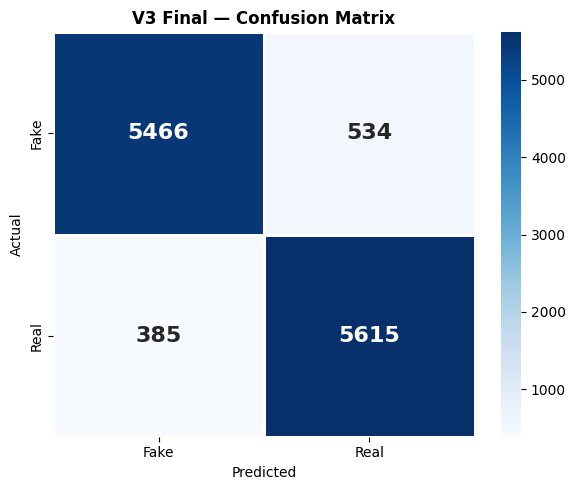

In [20]:
# ── Final test evaluation ─────────────────────────────────────
m_eval = build_efficientnet()
m_eval.load_state_dict(torch.load(MODEL_SAVE, map_location=device))
m_eval = m_eval.to(device)

_, _, preds, labels = eval_epoch(m_eval, test_loader)

print(f"\n{'='*50}")
print(f"  V3 MODEL — FINAL TEST RESULTS")
print(f"{'='*50}")
print(f"  Accuracy : {accuracy_score(labels,preds)*100:.2f}%")
print(f"  Precision: {precision_score(labels,preds,zero_division=0)*100:.2f}%")
print(f"  Recall   : {recall_score(labels,preds,zero_division=0)*100:.2f}%")
print(f"  F1-Score : {f1_score(labels,preds,zero_division=0)*100:.2f}%")
print(f"{'='*50}")
print(classification_report(labels, preds,
                             target_names=['Fake','Real'],
                             zero_division=0))

cm = confusion_matrix(labels, preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Fake','Real'],
            yticklabels=['Fake','Real'],
            linewidths=2, linecolor='white',
            annot_kws={"size":16,"weight":"bold"})
plt.title('V3 Final — Confusion Matrix', fontweight='bold')
plt.ylabel('Actual'); plt.xlabel('Predicted')
plt.tight_layout()
plt.savefig("/kaggle/working/v3_confusion_matrix.png", dpi=150)
plt.show()

In [10]:
model.load_state_dict(torch.load(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v3_best.pth",
    map_location=device))

<All keys matched successfully>

In [12]:
model.load_state_dict(torch.load(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v3_best.pth",
    map_location=device))
model = model.to(device).eval()
print("✅ V3 loaded from dataset!")

✅ V3 loaded from dataset!


In [14]:
import os
for root, dirs, files in os.walk('/kaggle/input/datasets/ravalkolpravalika/'):
    for f in files:
        print(os.path.join(root, f))

/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v3_best.pth
/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/v3_checkpoint_epoch_2.pth
/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v2_best.pth


In [15]:
state_dict = torch.load(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v3_best.pth",
    map_location=device)

# Fix DataParallel keys if present
if any(k.startswith('module.') for k in state_dict.keys()):
    state_dict = {k.replace('module.', ''): v for k,v in state_dict.items()}

model.load_state_dict(state_dict)
model = model.to(device).eval()
print("✅ V3 loaded successfully!")

✅ V3 loaded successfully!


In [17]:
import torch
ckpt = torch.load(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v3_best.pth",
    map_location='cpu')

print(type(ckpt))
if isinstance(ckpt, dict):
    print("Keys:", list(ckpt.keys())[:5])

<class 'dict'>
Keys: ['features.0.0.weight', 'features.0.1.weight', 'features.0.1.bias', 'features.0.1.running_mean', 'features.0.1.running_var']


In [18]:
model.load_state_dict(torch.load(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v3_best.pth",
    map_location=device))
model = model.to(device).eval()
print("✅ V3 loaded!")

✅ V3 loaded!


✅ V3 model loaded!
Add your test images to /kaggle/working/test_images/
Or use dataset images directly — testing on dataset samples now:



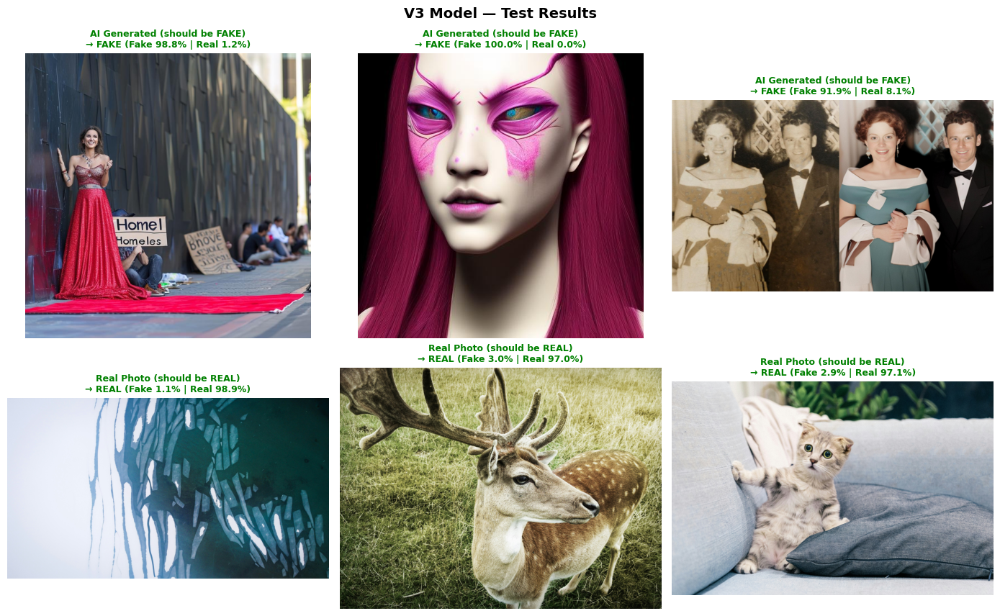


✅ Results saved to /kaggle/working/v3_test_results.png


In [20]:
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms, models
import matplotlib.pyplot as plt
import numpy as np

# Load V3 model
def build_efficientnet(num_classes=2, dropout=0.3):
    m = models.efficientnet_b0(weights='IMAGENET1K_V1')
    for p in m.parameters(): p.requires_grad = False
    for p in m.features[5:].parameters(): p.requires_grad = True
    inf = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(dropout), nn.Linear(inf,512),
        nn.ReLU(), nn.Dropout(dropout/2), nn.Linear(512,2))
    return m

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = build_efficientnet()
model.load_state_dict(torch.load("/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/efficientnet_v3_best.pth",
                                  map_location=device))
model = model.to(device).eval()
print("✅ V3 model loaded!")

tfm = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])])

def predict(path):
    img = Image.open(path).convert('RGB')
    t   = tfm(img).unsqueeze(0).to(device)
    with torch.no_grad():
        p = torch.softmax(model(t), dim=1)
    fp = p[0][0].item()*100
    rp = p[0][1].item()*100
    return img, fp, rp

# Upload and test
from kaggle_secrets import UserSecretsClient
import os

# Upload test images
!mkdir -p /kaggle/working/test_images

print("Add your test images to /kaggle/working/test_images/")
print("Or use dataset images directly — testing on dataset samples now:\n")

# Test on 3 fake + 3 real from the dataset
test_cases = [
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/fake/0001.jpg", "AI Generated (should be FAKE)"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/fake/0002.jpg", "AI Generated (should be FAKE)"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/fake/0003.jpg", "AI Generated (should be FAKE)"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/real/0001.jpg", "Real Photo (should be REAL)"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/real/0002.jpg", "Real Photo (should be REAL)"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/real/0003.jpg", "Real Photo (should be REAL)"),
]

fig, axes = plt.subplots(2, 3, figsize=(14, 9))
axes = axes.flatten()

for i, (path, label) in enumerate(test_cases):
    img, fp, rp = predict(path)
    verdict = "FAKE" if fp >= 50 else "REAL"
    correct = ("FAKE" in label and verdict=="FAKE") or ("REAL" in label and verdict=="REAL")
    color   = "green" if correct else "red"
    axes[i].imshow(img)
    axes[i].set_title(f"{label}\n→ {verdict} (Fake {fp:.1f}% | Real {rp:.1f}%)",
                      color=color, fontsize=9, fontweight='bold')
    axes[i].axis('off')

plt.suptitle("V3 Model — Test Results", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("/kaggle/working/v3_test_results.png", dpi=150)
plt.show()
print("\n✅ Results saved to /kaggle/working/v3_test_results.png")

In [27]:
# Test YOUR own uploaded images
from kaggle_secrets import UserSecretsClient
import glob

# Upload images via Kaggle dataset and point here
your_images = glob.glob("/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/*.jpg")
for path in your_images[:30]:
    img, fp, rp = predict(path)
    verdict = "FAKE" if fp>=50 else "REAL"
    print(f"{os.path.basename(path)}: {verdict} (Fake {fp:.1f}% | Real {rp:.1f}%)")

0011.jpg: REAL (Fake 0.1% | Real 99.9%)
faceswap3.jpg: REAL (Fake 2.9% | Real 97.1%)
manipul3.jpg: FAKE (Fake 64.3% | Real 35.7%)
nature.jpg: FAKE (Fake 89.8% | Real 10.2%)
0019.jpg: FAKE (Fake 99.9% | Real 0.1%)
IMG20231106151733.jpg: FAKE (Fake 60.6% | Real 39.4%)
00PYA83V1P.jpg: FAKE (Fake 100.0% | Real 0.0%)
HD-wallpaper-prabhas-bahubali-south-india-actor.jpg: REAL (Fake 33.5% | Real 66.5%)
faceswap2.jpg: FAKE (Fake 56.9% | Real 43.1%)
manipul.jpg: REAL (Fake 0.1% | Real 99.9%)
ai image.jpg: FAKE (Fake 84.1% | Real 15.9%)
a949303df9fca80e03c0affe7bbad12a.jpg: REAL (Fake 8.8% | Real 91.2%)
3D1jpg.jpg: FAKE (Fake 99.7% | Real 0.3%)
manipul2.jpg: REAL (Fake 34.0% | Real 66.0%)
CGI2.jpg: FAKE (Fake 84.9% | Real 15.1%)
faceswap.jpg: FAKE (Fake 68.7% | Real 31.3%)
nature2.jpg: REAL (Fake 14.3% | Real 85.7%)


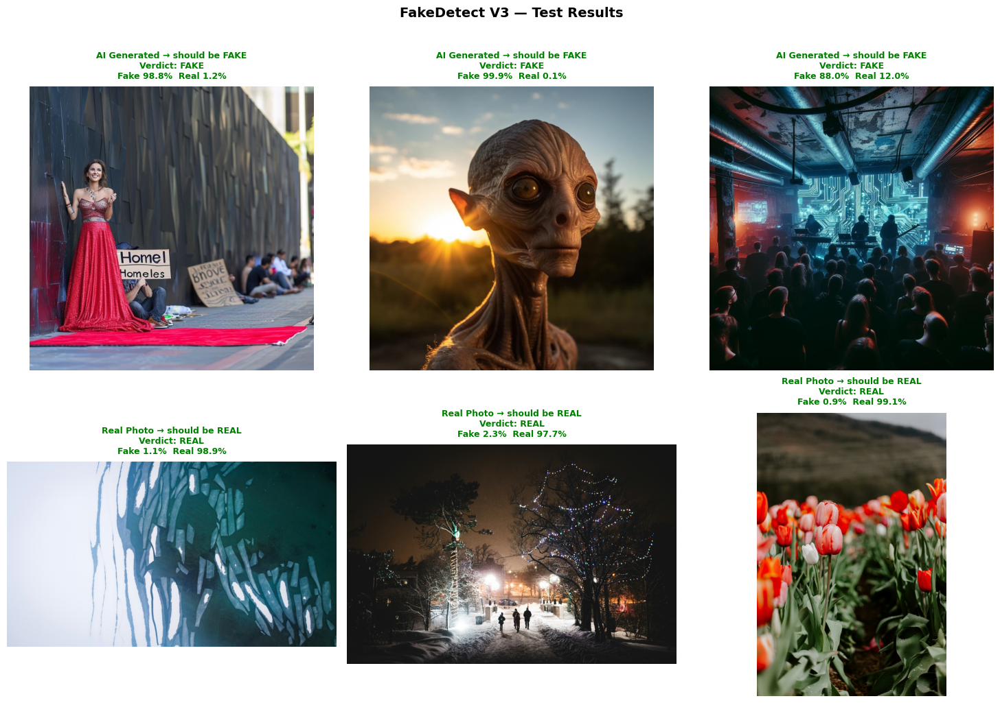

✅ Done!


In [28]:
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

tfm = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])])

def predict(path):
    img = Image.open(path).convert('RGB')
    t   = tfm(img).unsqueeze(0).to(device)
    with torch.no_grad():
        p = torch.softmax(model(t), dim=1)
    return img, p[0][0].item()*100, p[0][1].item()*100

# Test on dataset samples
test_cases = [
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/fake/0001.jpg", "AI Generated → should be FAKE"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/fake/0010.jpg", "AI Generated → should be FAKE"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/fake/0020.jpg", "AI Generated → should be FAKE"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/real/0001.jpg", "Real Photo → should be REAL"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/real/0010.jpg", "Real Photo → should be REAL"),
    ("/kaggle/input/datasets/tristanzhang32/ai-generated-images-vs-real-images/test/real/0020.jpg", "Real Photo → should be REAL"),
]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, (path, label) in enumerate(test_cases):
    img, fp, rp = predict(path)
    verdict = "FAKE" if fp >= 50 else "REAL"
    correct = ("FAKE" in label and verdict=="FAKE") or \
              ("REAL" in label and verdict=="REAL")
    color = "green" if correct else "red"
    axes[i].imshow(img)
    axes[i].set_title(
        f"{label}\nVerdict: {verdict}\nFake {fp:.1f}%  Real {rp:.1f}%",
        color=color, fontsize=9, fontweight='bold', pad=8)
    axes[i].axis('off')

plt.suptitle("FakeDetect V3 — Test Results", fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig("/kaggle/working/v3_test_results.png", dpi=150, bbox_inches='tight')
plt.show()
print("✅ Done!")

Found 20 images


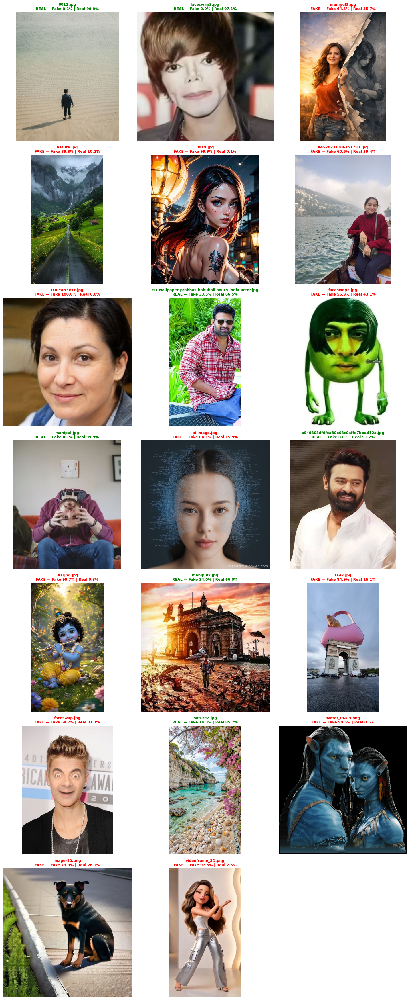

✅ Done!


In [31]:
import glob, os
import matplotlib.pyplot as plt

your_images = glob.glob(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/*.jpg") + \
    glob.glob(
    "/kaggle/input/datasets/ravalkolpravalika/deepfake-model-checkpoint/*.png")

print(f"Found {len(your_images)} images")

if len(your_images) == 0:
    print("❌ No images found — upload jpg/png images to your dataset first!")
else:
    cols = 3
    rows = (len(your_images[:20]) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows*5))
    axes = axes.flatten() if rows > 1 else [axes] if cols==1 else axes.flatten()

    for i, path in enumerate(your_images[:20]):
        img, fp, rp = predict(path)
        verdict = "FAKE" if fp >= 50 else "REAL"
        color   = "red" if verdict=="FAKE" else "green"
        axes[i].imshow(img)
        axes[i].set_title(
            f"{os.path.basename(path)}\n{verdict} — Fake {fp:.1f}% | Real {rp:.1f}%",
            color=color, fontsize=9, fontweight='bold')
        axes[i].axis('off')

    # Hide unused axes
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.savefig("/kaggle/working/my_images_results.png", dpi=150)
    plt.show()
    print("✅ Done!")